In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data.sampler import SubsetRandomSampler
import random
import torch.nn.functional as F
from torch.autograd import Variable
from tqdm import tqdm
import os

! pip install pytorch-lightning
! pip install optuna

import pytorch_lightning as pl
import optuna

# Classification task

### Dataset

In [2]:
train_dataset = datasets.FashionMNIST('classifier_data', train=True, download=True)

test_dataset  = datasets.FashionMNIST('classifier_data', train=False, download=True)

C:\Users\stefa\anaconda3\lib\site-packages\torchvision\datasets\mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [3]:
print(train_dataset)

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: classifier_data
    Split: Train


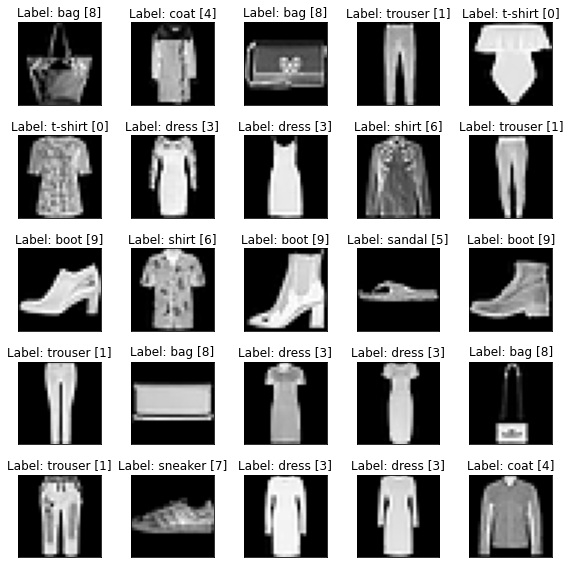

In [4]:
### Plot some sample
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']

fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title(f'Label: {label_names[label]} [{label}]')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [5]:
train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5),(0.5),)
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5),(0.5),)
])

# Set the train transform
train_dataset.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

In [6]:
train_split, val_split = torch.utils.data.random_split(train_dataset, [50000, 10000])

In [7]:
### Define train dataloader
train_dataloader = DataLoader(train_split, shuffle=True, batch_size=64, num_workers=0)

### Define validation dataloader
val_dataloader = DataLoader(val_split, batch_size=64, shuffle=False, num_workers=0)

### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=1000, shuffle=False, num_workers=0)

In [8]:
dataiter = iter(train_dataloader)
print(dataiter)
images, labels =  dataiter.next()

## Network Definition

In [9]:
class Basic_Classifier(nn.Module):
    
    def __init__(self, Ni, Nh1, Nh2, Nh3, No, drop=0.2):
        
        super(Basic_Classifier, self).__init__()
        
        print('Network initialized')

        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
        self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2)
        self.fc3 = nn.Linear(in_features=Nh2, out_features=Nh3)
        self.out = nn.Linear(in_features=Nh3, out_features=No)
        self.dropout = nn.Dropout(drop)

    def forward(self, x, additional_out=False):
        x = x.view(x.shape[0], -1)
        #print(x.size())
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.dropout(F.relu(self.fc2(x)))
        x = self.dropout(F.relu(self.fc3(x)))
        x = F.log_softmax(self.out(x), dim=1)
        return x


In [10]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")


Training device: cpu


In [11]:
# Initialize the network
torch.manual_seed(0)
Ni = 784
Nh1 = 256
Nh2 = 128
Nh3 = 64
No = 10

In [12]:
net = Basic_Classifier(Ni, Nh1, Nh2, Nh3, No)
net.to(device)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.SGD(net.parameters(), lr=1e-2, momentum=0.9)

Network initialized


# Training Loop

In [13]:
def train_step(net, train_dataloader, optimizer, loss_fn, device):

  train_loss = []
  net.train()

  for sample_batched in train_dataloader:

    # Move data and labels to device
    x_batch = sample_batched[0].to(device) 
    label_batch = sample_batched[1].to(device)

    # Forward pass
    out = net(x_batch)

    # Compute loss
    loss = loss_fn(out, label_batch)

    # Backpropagation
    net.zero_grad()
    loss.backward()

    # Update the weights
    optimizer.step()

    # Save train loss for this batch
    loss_batch = loss.detach().cpu().numpy()
    train_loss.append(loss_batch)

  return train_loss

In [14]:
def validation_step(net, valid_dataloader, loss_fn, device):
  
  val_loss= []
  net.eval() # Evaluation mode (e.g. disable dropout, batchnorm,...)
  
  with torch.no_grad(): # Disable gradient tracking
    for sample_batched in valid_dataloader:

      # Move data and labels to device
      x_batch = sample_batched[0].to(device)
      label_batch = sample_batched[1].to(device)

      # Forward pass
      out = net(x_batch)

      # Compute loss
      loss = loss_fn(out, label_batch)

      # Save val loss for this batch
      loss_batch = loss.detach().cpu().numpy()
      val_loss.append(loss_batch)

  return val_loss

In [15]:
def training_loop(net, train_dataloader, valid_dataloader, optimizer, loss_fn, device, num_epochs):
 
  train_loss_log = []
  val_loss_log = []

  for num_epoch in tqdm(range(num_epochs)):
    ### TRAIN STEP

    train_loss = train_step(net, train_dataloader, 
                            optimizer, loss_fn, device)
    train_loss = np.mean(train_loss)
    train_loss_log.append(train_loss)

    #if epoch_num%10==0: 
      #print(f"AVERAGE TRAIN LOSS: {train_loss}")


    ### VALIDATION STEP

    val_loss = validation_step(net, valid_dataloader,
                                      loss_fn, device)
    val_loss = np.mean(val_loss)
    val_loss_log.append(val_loss)

  return train_loss_log, val_loss_log


In [16]:
num_epochs = 20
train_loss_log = []
val_loss_log = []

train_loss_log, val_loss_log = training_loop(net, train_dataloader, test_dataloader, optimizer,
                                             loss_fn, device, num_epochs)

100%|██████████| 20/20 [05:28<00:00, 16.43s/it]


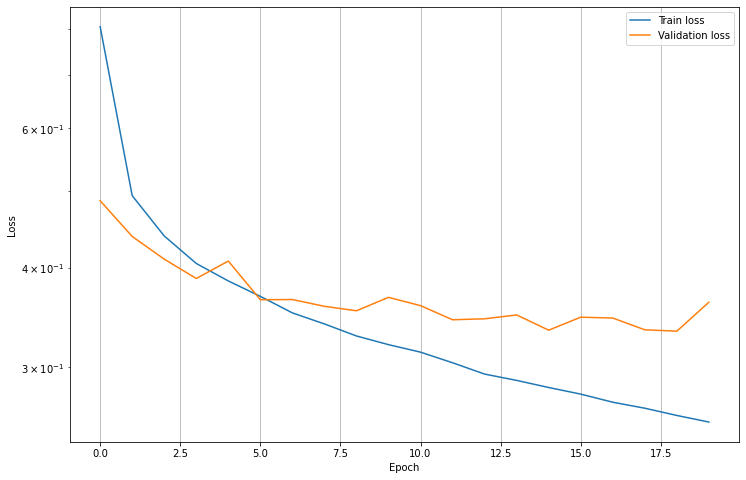

In [17]:
# Plot losses
plt.figure(figsize=(12,8))
plt.semilogy(train_loss_log, label='Train loss')
plt.semilogy(val_loss_log, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [18]:
def output_label(label):
    output_mapping = {
                 0: "T-shirt/Top",
                 1: "Trouser",
                 2: "Pullover",
                 3: "Dress",
                 4: "Coat", 
                 5: "Sandal", 
                 6: "Shirt",
                 7: "Sneaker",
                 8: "Bag",
                 9: "Ankle Boot"
                 }
    input = (label.item() if type(label) == torch.Tensor else label)
    return output_mapping[input]


In [19]:
class_correct = [0. for _ in range(10)]
total_correct = [0. for _ in range(10)]

with torch.no_grad():
    for sample_batched in test_dataloader:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)
        
        outputs = net(x_batch)
        predicted = torch.max(outputs, 1)[1]
        c = (predicted == label_batch).squeeze()
        #print(label_batch.shape)
        for i in range(label_batch.shape[0]):
            label = label_batch[i]
            class_correct[label] += c[i].item()
            total_correct[label] += 1
        
for i in range(10):
    print("Accuracy of {}: {:.2f}%".format(output_label(i), class_correct[i] * 100 / total_correct[i]))


Accuracy of T-shirt/Top: 83.10%
Accuracy of Trouser: 96.50%
Accuracy of Pullover: 69.80%
Accuracy of Dress: 83.90%
Accuracy of Coat: 84.60%
Accuracy of Sandal: 93.60%
Accuracy of Shirt: 75.70%
Accuracy of Sneaker: 97.50%
Accuracy of Bag: 97.00%
Accuracy of Ankle Boot: 94.30%


In [20]:
sum = 0
for i in range(10):
    sum += (class_correct[i] * 100 / total_correct[i])

sum/=10
print(sum)

87.6


## CNN Network Definition

In [17]:
class CNNClassifier(nn.Module):
    
    def __init__(self):
        super(CNNClassifier, self).__init__()
        
        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        
        self.fc1 = nn.Linear(in_features=64*6*6, out_features=600)
        self.drop = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(in_features=600, out_features=120)
        self.fc3 = nn.Linear(in_features=120, out_features=10)
        
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.view(out.size(0), -1)
        out = self.fc1(out)
        out = self.drop(out)
        out = self.fc2(out)
        out = self.fc3(out)
        
        return out

In [18]:
netCNN = CNNClassifier()
netCNN.to(device)

loss_fn = nn.CrossEntropyLoss()

optimizer = optim.Adam(netCNN.parameters(), lr=1e-3)

## Training Loop

In [19]:
num_epochs = 20
train_loss_log = []
val_loss_log = []

train_loss_log, val_loss_log = training_loop(netCNN, train_dataloader, test_dataloader, optimizer,
                                             loss_fn, device, num_epochs)

  0%|          | 0/20 [00:03<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
torch.save(netCNN.state_dict(), 'netCNN_params.pth')

In [ ]:
# Plot losses
plt.figure(figsize=(12,8))
plt.semilogy(train_loss_log, label='Train loss')
plt.semilogy(val_loss_log, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [ ]:
class_correct = [0. for _ in range(10)]
total_correct = [0. for _ in range(10)]

with torch.no_grad():
    for sample_batched in test_dataloader:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)
        
        outputs = netCNN(x_batch)
        predicted = torch.max(outputs, 1)[1]
        c = (predicted == label_batch).squeeze()
        #print(label_batch.shape)
        for i in range(label_batch.shape[0]):
            label = label_batch[i]
            class_correct[label] += c[i].item()
            total_correct[label] += 1
        
for i in range(10):
    print("Accuracy of {}: {:.2f}%".format(output_label(i), class_correct[i] * 100 / total_correct[i]))


In [ ]:
sum = 0
for i in range(10):
    sum += (class_correct[i] * 100 / total_correct[i])

sum/=10
print(sum)

## Activation analysis

In [ ]:
netCNN.load_state_dict(torch.load('netCNN_params.pth'))

In [ ]:
## Extract weights 
# Layer 1 weights
weights_l1 = netCNN.layer1[0].weight.data.cpu().numpy()
# Layer 2 weights
weights_l2 = netCNN.layer2[0].weight.data.cpu().numpy()

print(weights_l2.shape)

In [ ]:
### Plot the weights (this is a utility function, no need to analyze this code)
def plot_nchw_data(data, h_num, v_num, title):
    fig, axs = plt.subplots(h_num, v_num, figsize=(8,8))
    shape = data.shape
    data = data.reshape(shape[0]*shape[1], shape[2], shape[3])
    for idx, ax in enumerate(axs.flatten()):
        ax.set_xticks([])
        ax.set_yticks([])
        if idx < len(data):
            ax.imshow(data[idx,:,:], cmap='gray')
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.97], h_pad=0, w_pad=0)
    plt.show()

plot_nchw_data(weights_l1, 4, 8, 'Layer 1 convolutional kernels')
plot_nchw_data(weights_l2, 24, 24, 'Layer 2 convolutional kernels')


In [ ]:
def get_activation(layer, input, output):
    global activation
    activation = torch.relu(output)

In [ ]:
image = DataLoader(test_dataset, batch_size=1, shuffle=False) 

### Register hook  
hook_handle = netCNN.layer1.register_forward_hook(get_activation)

### Analyze activations
net = netCNN.to(device)
net.eval()

with torch.no_grad():
    for s_batch in image:
        # Move data to device
        x1 = s_batch[0].to(device)
        # Forward pass
        y1 = netCNN(x1)
        z1 = activation

### Remove hook
hook_handle.remove()

act1 = z1.cpu().numpy()

In [ ]:
## Plot activations
fig, ax = plt.subplots(1, 10, figsize=(16,3))
for i in range(10):
    ax[i].imshow( act1[0, i, :, :], cmap='Greys')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

fig.suptitle('Activation profile - first convolutional layer')    
plt.tight_layout()

plt.show()  

In [40]:
# Define a LightningModule (nn.Module subclass)
# A LightningModule defines a full system (ie: a GAN, autoencoder, BERT or a simple Image Classifier).

class LitNet(pl.LightningModule):
    
    def __init__(self, trial):
       
        super().__init__()
        
        self.classifier = nn.Sequential(
                                        nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1),
                                        #nn.BatchNorm2d(32),
                                        nn.ReLU(),
                                        nn.MaxPool2d(kernel_size=2, stride=2),
        
                                        nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
                                        nn.BatchNorm2d(64),
                                        nn.ReLU(),
                                        nn.MaxPool2d(2),
                                            
                                        nn.Flatten(),
                                        nn.Linear(in_features=64*6*6, out_features=120),
                                        nn.Dropout2d(0.25),
                                        nn.Linear(in_features=120, out_features=60),
                                        nn.Linear(in_features=60, out_features=10)
                                        )

        print('Network initialized')
                      
        self.trial = trial

    # Forward step defines how the LightningModule behaves during inference/prediction.
    def forward(self, x, additional_out=False):
        #x = x.view(x.shape[0], -1)
        out = self.classifier(x)
        return out
            
    # Training_step defines the training loop. 
    def training_step(self, batch, batch_idx=None):
        # training_step defines the train loop. It is independent of forward
        x_batch = batch[0]
        label_batch = batch[1]
        out = self.classifier(x_batch)
        train_loss = F.cross_entropy(out, label_batch)
        self.log("train_loss", train_loss.item())
        return train_loss

    def validation_step(self, batch, batch_idx=None, loss_name='valid_loss'):
        # training_step defines the train loop. It is independent of forward
        x_batch = batch[0]
        label_batch = batch[1]
        out = self.classifier(x_batch)
        val_loss = F.cross_entropy(out, label_batch)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss

    def configure_optimizers(self):
        lr  = self.trial.suggest_loguniform('learning_rate', 1e-5, 5e-3)
        opt = self.trial.suggest_categorical('optimizer', ['sgd', 'Adam'])
        wd  = self.trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)
        mom = self.trial.suggest_uniform('momentum', 0.6, 1.)
        if opt=='sgd':
            optimizer = torch.optim.SGD(self.parameters(), lr=lr, momentum=mom, weight_decay=wd)
        elif opt=='Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)

        return optimizer

In [41]:
class MetricsCallback(pl.Callback):
    '''
    To return losses and other metrics logged during training and validation.
    '''

    def __init__(self):
        super().__init__()
        self.metrics = []

    def on_validation_end(self, trainer, pl_module):
        self.metrics.append(trainer.callback_metrics)

In [42]:
train_dataset = datasets.FashionMNIST('classifier_data', train=True, download=True)

test_dataset  = datasets.FashionMNIST('classifier_data', train=False, download=True)

In [43]:
train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5),(0.5),)
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5),(0.5),)
])

# Set the train transform
train_dataset.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

In [44]:
train_split, val_split = torch.utils.data.random_split(train_dataset, [50000, 10000])

In [45]:
### Define train dataloader
train_dataloader = DataLoader(train_split, shuffle=True, batch_size=256, num_workers=0)

### Define validation dataloader
val_dataloader = DataLoader(val_split, batch_size=256, shuffle=False, num_workers=0)

### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False, num_workers=0)

In [46]:
# prepare validation set by splitting the train one
train_dataset, valid_dataset = torch.utils.data.random_split(train_dataset, [50000, 10000])

# set up dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=8)
valid_dataloader = DataLoader(valid_dataset, batch_size=256, shuffle=False, num_workers=8)

test_dataloader  = DataLoader(test_dataset, batch_size=256, shuffle=False)

In [47]:
def objective(trial):
    # Function to optimize from optuna
    metrics_callback = MetricsCallback()
    
    trainer = pl.Trainer( logger=False,
                          max_epochs=30,
                          gpus=-1 if torch.cuda.is_available() else None,
                          callbacks=[ metrics_callback, 
                                    optuna.integration.PyTorchLightningPruningCallback(trial, monitor="valid_loss"),
                                    pl.callbacks.progress.TQDMProgressBar(refresh_rate=20)])
                         

    model = LitNet(trial)
    trainer.fit(model, train_dataloader, val_dataloader)

    return metrics_callback.metrics[-1]["valid_loss"].item()

In [ ]:
pruner: optuna.pruners.BasePruner = optuna.pruners.NopPruner()
    
study = optuna.create_study(direction="minimize", pruner=pruner)

#study.enqueue_trial({'optimizer': 'Adam', 'learning_rate': 1e-3, 'weight_decay': 1e-5, 'momentum': 0.9})# select starting point

study.optimize(objective, n_trials=100, timeout=None)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2022-01-01 21:27:19,811] A new study created in memory with name: no-name-43f8cf68-230c-4ef9-b8f3-8048a3e1a545
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name       | Type       | Params
------------------------------------------
0 | classifier | Sequential | 303 K 
------------------------------------------
303 K     Trainable params
0         Non-trainable params
303 K     Total params
1.214     Total estimated model params size (MB)


Network initialized


C:\Users\stefa\anaconda3\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:623: UserWarning: Checkpoint directory C:\Users\stefa\Desktop\UNIPD\5 ANNO\NEURAL NETWORKS AND DEEP LEARNING\LABS\HW\HW1\checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")


Validation sanity check: 0it [00:00, ?it/s]

C:\Users\stefa\anaconda3\lib\site-packages\pytorch_lightning\trainer\data_loading.py:111: UserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

In [ ]:
optuna.visualization.plot_optimization_history(study, target_name='Validation loss')